In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

params = {
            'animation.html' : 'jshtml',
            'figure.figsize' : (16, 9),
            'legend.fontsize': 'x-large',
            'axes.labelsize': 'x-large',
            'axes.titlesize':'x-large',
            'xtick.labelsize':'x-large',
            'ytick.labelsize':'x-large',
            'animation.embed_limit': '100'
         }
plt.rcParams.update(params)

In [2]:
def randDigit():
    return np.random.randint(10)


def randPoint():
    x, y = np.random.randint(0, 9), np.random.randint(0, 9)
    return (x, y)

def isColumnUnique(v, at, I):
    x, y = at
    for i in range(9):
        val = I[i][x]
        if val == v:
            return False
    
    return True

def placeMissing(I):
    missing = {i: [] for i in range(9)}
    for y in range(9):
        for x in range(9):
            if I[y][x] == 0:
                v = randDigit()
                while not isColumnUnique(v, (x, y), I):
                    v = randDigit()
                I[y][x] = v
                missing[x].append((x, y))

    return missing

def readFile(filename):
    I = np.empty(shape = (9, 9), dtype = np.uint8)
    with open(filename) as file:
        for y, line in enumerate(file):
            values = line.split()
            for x, value in enumerate(values):
                if value == 'x':
                    I[y, x] = 0
                else:
                    I[y, x] = int(value)

    return I

In [3]:
def swap(p1, p2, I):
    (x1, y1) = p1
    (x2, y2) = p2

    I[y1][x1], I[y2][x2] = I[y2][x2], I[y1][x1]

In [6]:
def getBox(at):
    x, y = at
    box  = []

    xStart = (x // 3) * 3
    yStart = (y // 3) * 3

    for ny in range(yStart, yStart + 3):
        for nx in range(xStart, xStart + 3):
            if x != nx or y != ny: 
                box.append((nx, ny))

    return box

def singleFieldCostF(at, I):
    x, y = at
    cost = 0.0

    # box
    for (nx, ny) in getBox(at):
        if I[ny, nx] == I[y, x]:
            cost += 1.0
    # row
    for nx in range(9):
        if nx != x and I[y, nx] == I[y, x]:
            cost += 1.0
    
    # column - neglegible
    for ny in range(9):
        if ny != y and I[ny, x] == I[y, x]:
            cost += 1.0

    return cost


def totalCost(I):
    cost = 0.0
    for y in range(9):
        for x in range(9):
            cost += singleFieldCostF((x, y), I)
    
    return cost



In [4]:
def pickOne(list):
    le = len(list)
    i  = np.random.randint(0, le)

    return list[i]

# We swap points lying in the same column!
def stateF(I, missing):
    column = np.random.randint(0, 9)
    while len(missing[column]) < 2:
        column = np.random.randint(0, 9)

    p1 = pickOne(missing[column])
    p2 = pickOne(missing[column])

    while p1 == p2:
        p2 = pickOne(missing[column])

    swap(p1, p2, I)

    return p1, p2

In [5]:
def exp_decay_v9(temp):
    return .9 * temp

def exp_decay_v99(temp):
    return .99 * temp

def exp_decay_v999(temp):
    return .999 * temp

def exp_decay_v9999(temp):
    return .9999 * temp

def exp_decay_v99999(temp):
    return .99999 * temp

In [24]:
from IPython.display import clear_output

def simulated_annealing(I, missing, temp_start, temp_limit, tempF, breakAfter = 25, gather_data = False, iterationsLimit = 80000):
    cost   = totalCost(I)
    moves  = 0
    temperature = temp_start

    temps, costs, moveList = [], [], []

    while True:
        found = 0
        moves += 1
        p1, p2 = stateF(I, missing)
        alternate_cost = totalCost(I)
        delta = cost - alternate_cost

        if delta > 0 or (math.e ** (delta / temperature)) > np.random.rand():
            cost = alternate_cost
        else:
            swap(p2, p1, I)
        
        if delta > 0:
            found += 1
            if found > breakAfter:
                break

        if moves % 250 == 0:
            clear_output(wait=True)
            print('Temperature:', temperature)
            print('Cost:', cost)
            print('Move:', moves)
            print(str(I))

        if gather_data:
            temps.append(temperature)
            costs.append(cost)
            moveList.append(moves)

        if cost <= 0.0 or temperature <= temp_limit or moves >= iterationsLimit:
            clear_output(wait=True)
            print('Temperature:', temperature)
            print('Cost:', cost)
            print('Move:', moves)
            print(str(I))
            break

        temperature = tempF(temperature)
    
    if gather_data:
        return temps, costs, moveList
    else:
        return moves, cost

In [28]:
def solve(filename, temp_start = 1.1, temp_limit = 0.1, tempF = exp_decay_v99999, iterationsLimit = 80000):
    I = readFile(filename)
    missing = placeMissing(I)

    return simulated_annealing(I, missing, temp_start, temp_limit, tempF, iterationsLimit=iterationsLimit)

In [33]:
solve("sudoku-tests/empty.txt")

Temperature: 0.9200744270435519
Cost: 0.0
Move: 17862
[[3 6 7 9 4 8 2 1 5]
 [1 4 2 6 5 7 9 8 3]
 [5 8 9 3 1 2 6 4 7]
 [7 1 5 8 3 6 4 9 2]
 [2 9 6 5 7 4 8 3 1]
 [8 3 4 1 2 9 7 5 6]
 [9 5 8 2 6 1 3 7 4]
 [4 2 3 7 8 5 1 6 9]
 [6 7 1 4 9 3 5 2 8]]


(17862, 0.0)

In [27]:
# This will probably work only when missing is > 40.
def generate(fill):
    I = np.zeros((9, 9), dtype = np.uint8)
    while fill > 0:
        x, y = randPoint()
        if I[y, x] != 0:
            continue
        
        v = randDigit()
        I[y, x] = v
        if isValid((x, y), I):
            fill -= 1
        else:
            I[y, x] = 0

    return I

def isValid(p, I):
    x, y = p

    for (nx, ny) in getBox(p):
        if I[ny, nx] == I[y, x]:
            return False
    
    for nx in range(9):
        if x != nx and I[y, nx] == I[y, x]:
            return False

    for ny in range(9):
        if y != ny and I[ny, x] == I[y, x]:
            return False

    return True

In [11]:
import matplotlib.pyplot as plt

def solveGenerated(fill, vis = False, temp_start = 1.1, temp_limit = 1e-1, tempF = exp_decay_v99999):
    I = generate(fill)
    missing = placeMissing(I)

    if vis:
        temps, costs, moveList = simulated_annealing(I, missing, temp_start, temp_limit, tempF,gather_data=True)
        clear_output(wait=True)
        plt.scatter(temps, costs, cmap = 'gray', marker='o', s = 50)

    else:
        return simulated_annealing(I, missing, temp_start, temp_limit, tempF)

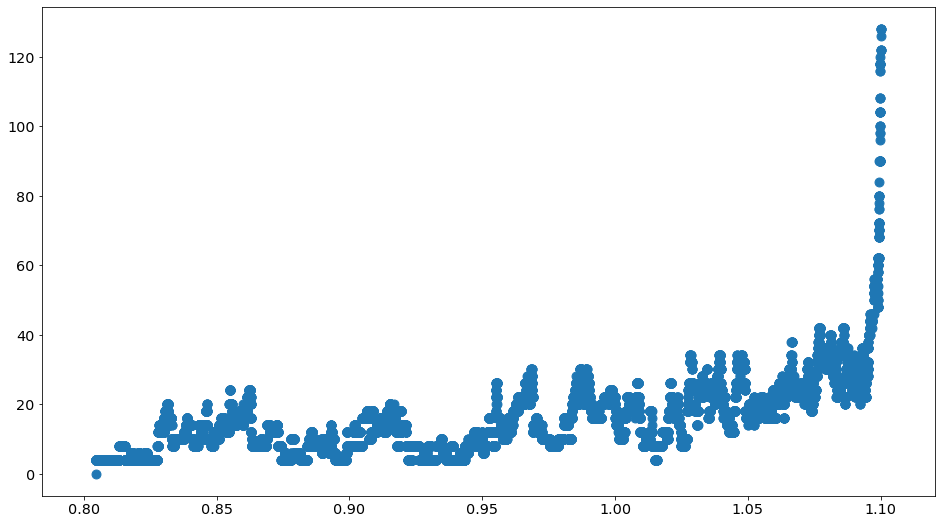

In [28]:
solveGenerated(10, vis = True)

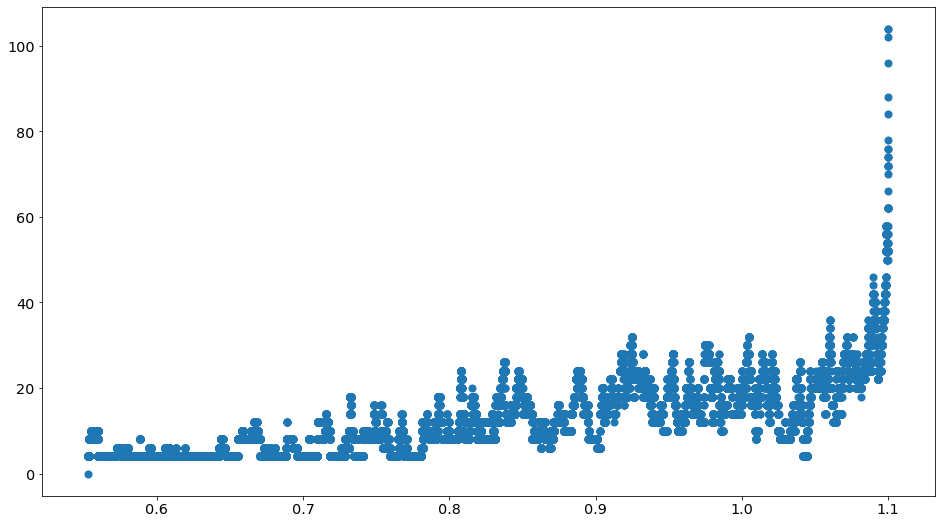

In [12]:
solveGenerated(20, vis = True)

In [16]:
def test_suite():
    movL, empL = [], []
    for i in range(0, 23):
        empL.append(81 - i)
        moves, cost = solveGenerated(i)
        movL.append(moves)

    plt.scatter(empL, movL, cmap = 'gray', marker='o', s = 200)

Temperature: 0.4942648261223305
Cost: 12.0
Move: 80000
[[7 4 9 6 2 8 3 6 5]
 [1 3 2 9 5 7 1 4 8]
 [5 6 8 1 4 3 9 2 7]
 [3 5 4 7 1 6 2 8 6]
 [6 8 7 3 9 2 4 5 1]
 [2 9 1 4 8 5 7 9 3]
 [4 1 6 2 7 9 5 3 9]
 [8 7 3 5 6 4 8 1 2]
 [9 2 5 8 3 1 6 7 4]]


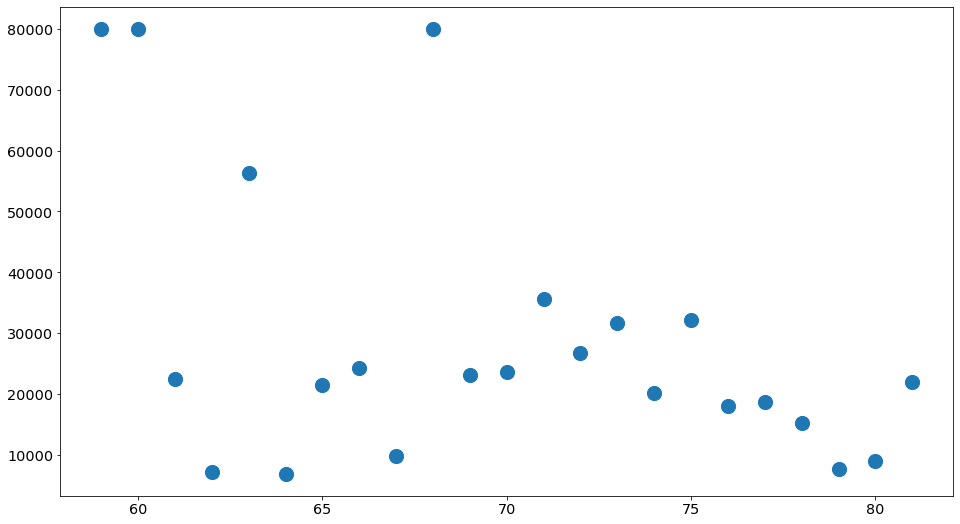

In [17]:
## Takes a lot of time...
test_suite()